In [2]:
import pandas as pd
import os
from pathlib import Path
from tqdm import tqdm
import numpy as np
import plotly.graph_objects as go

import plotly.io as pio
import plotly.offline as pyo
import plotly.express as px

%matplotlib inline

In [3]:
df = pd.read_csv('hellaswag_results.csv')

In [4]:
df.head()

,acc,acc_norm,log_likelihood,num_words,num_bytes,num_bits_per_byte,word_perplexity,byte_perplexity,lang,model,template
0,0.0,0.0,-605.538757,46,743,743,5.211984e+05,2.259157,Marathi,8b,chat
1,0.0,1.0,-541.022888,38,678,678,1.524908e+06,2.221025,Marathi,8b,chat
2,0.0,0.0,-528.661438,37,656,656,1.604218e+06,2.238680,Marathi,8b,chat
3,0.0,1.0,-349.893524,24,282,282,2.145529e+06,3.458231,Marathi,8b,chat
4,1.0,0.0,-518.971436,43,629,629,1.743994e+05,2.282049,Marathi,8b,chat


In [15]:
df['log_word_ppl'] = df.word_perplexity.apply(lambda x : np.log(x))
df['log_byte_ppl'] = df.byte_perplexity.apply(lambda x : np.log(x))

trained_lang = ['Arabic','Chinese','Czech','Dutch','English',
 'French','German','Greek','Hebrew','Hindi','Indonesian',
 'Italian','Japanese','Korean','Persian','Polish','Portuguese',
 'Romanian','Russian','Spanish','Turkish','Ukrainian','Vietnamese']

df['trained'] = df.lang.apply(lambda x : 1 if x in trained_lang else 0)

In [6]:
len(df)

1103820

## Helper Functions

In [7]:
def scaled_boxplot(df, group_vars, num_var, y_axis_var, color_var=None, layout_var = None, order_by = None):

    if len(group_vars) == 2:
        return boxplot_2cat(df, group_vars, num_var, y_axis_var, color_var, layout_var, order_by)
    elif len(group_vars) == 1:
        return boxplot_1cat(df, group_vars, num_var, y_axis_var, layout_var, order_by)
    else:
        return ValueError('No of grouping vars is >2')
    
        


In [8]:
def boxplot_2cat(df, group_vars, num_var, y_axis_var, color_var, layout_var = None, order_by = None):

    out = df.groupby(group_vars)[num_var].describe().reset_index()
    out['IQR'] = out.apply(lambda x : x['75%'] - x['25%'],axis = 1 )
    out['upperfence'] = out.apply(lambda x : x['75%'] + 1.5* x['IQR'],axis = 1 )
    out['lowerfence'] = out.apply(lambda x : x['75%'] - 1.5* x['IQR'],axis = 1 )

    if order_by:
        out = out.sort_values(order_by)

    fig = go.Figure()
    
    # Add box traces for each 'acc' category
    for color_value in out[color_var].unique():
        plot_df = out[out[color_var] == color_value]
        
        fig.add_trace(go.Box(
            # x=df_filtered['byte_perplexity'],
            y=plot_df[y_axis_var],
            name=f'acc={color_value}',
            orientation='h',
            marker_color='blue' if color_value == 0 else 'red',  # Adjust colors as needed,
            boxpoints = False,
            median = plot_df['50%'],
            q1 = plot_df['25%'],
            q3 = plot_df['75%'],
            upperfence=plot_df['upperfence'],
            lowerfence=plot_df['lowerfence'],
            
        ))
    
    if layout_var:
        fig.update_layout(**layout_var)

    return fig

def boxplot_1cat(df, group_vars, num_var, y_axis_var, layout_var = None, order_by = None):

    out = df.groupby(group_vars)[num_var].describe().reset_index()
    out['IQR'] = out.apply(lambda x : x['75%'] - x['25%'],axis = 1 )
    out['upperfence'] = out.apply(lambda x : x['75%'] + 1.5* x['IQR'],axis = 1 )
    out['lowerfence'] = out.apply(lambda x : x['75%'] - 1.5* x['IQR'],axis = 1 )
    if order_by:
        out = out.sort_values(order_by)

    fig = go.Figure()
    
    # Add box traces for each 'acc' category
    plot_df = out
        
    fig.add_trace(go.Box(
        # x=df_filtered['byte_perplexity'],
        y=plot_df[y_axis_var],
        # name=f'acc={color_value}',
        orientation='h',
        # marker_color='blue' if color_value == 0 else 'red',  # Adjust colors as needed,
        boxpoints = False,
        median = plot_df['50%'],
        q1 = plot_df['25%'],
        q3 = plot_df['75%'],
        upperfence=plot_df['upperfence'],
        lowerfence=plot_df['lowerfence'],
        
    ))
    
    if layout_var:
        fig.update_layout(**layout_var)

    return fig


    
    

## Visualization focusing on Model Performance

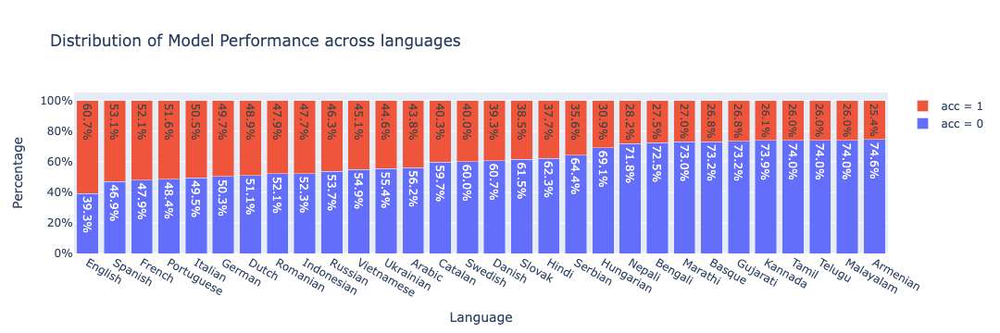

In [5]:
result = df.groupby('lang')['acc'].value_counts(normalize=True).unstack()
result = result.sort_values(by=1, ascending=False)

# Create the stacked bar chart
fig = go.Figure()

for acc_value in [0, 1]:
    fig.add_trace(go.Bar(
        x=result.index,
        y=result[acc_value],
        name=f'acc = {acc_value}',
        text=[f'{value:.1%}' for value in result[acc_value]],
        textposition='auto'
    ))

# Update layout
fig.update_layout(
    title='Distribution of Model Performance across languages',
    xaxis_title='Language',
    yaxis_title='Percentage',
    barmode='stack',
    yaxis=dict(tickformat='.0%')
)

# Show the plot
fig.show()

In [ ]:
model8b = df[df.model == '8b']
result8b = model8b.groupby('lang')['acc'].value_counts(normalize=True).unstack()
result8b = result8b.sort_values(by=1, ascending=False)

model35b = df[df.model == '35b']
result35b = model35b.groupby('lang')['acc'].value_counts(normalize=True).unstack()
result35b = result35b.sort_values(by=1, ascending=False)

# Create the stacked bar chart

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=['35b', '8b'])

for acc_value in [0, 1]:
    fig.add_trace(go.Bar(
        x=result8b.index,
        y=result8b[acc_value],
        name=f'acc = {acc_value}',
        text=[f'{value:.1%}' for value in result8b[acc_value]],
        textposition='auto'
    ), row = 1, col = 1)

for acc_value in [0, 1]:
    fig.add_trace(go.Bar(
        x=result35b.index,
        y=result35b[acc_value],
        name=f'acc = {acc_value}',
        text=[f'{value:.1%}' for value in result35b[acc_value]],
        textposition='auto'
    ), row = 1, col = 2)

# Update layout
fig.update_layout(
    title='Distribution of Model Performance across languages',
    xaxis_title='Language',
    yaxis_title='Percentage',
    barmode='stack',
    yaxis=dict(tickformat='.0%')
)

# Show the plot
fig.show()

In [ ]:


proportions = df.groupby(['lang', 'model'])['acc'].mean().reset_index()

proportions = proportions.sort_values(['model','acc'], ascending = [True, False])


# Create the bar plot
fig = px.bar(
    proportions,
    x='lang',          # X-axis: lang variable
    y='acc',           # Y-axis: acc value
    color='model',     # Different bars for each model
    barmode='group'    # Group bars for each lang value
)

# Update layout for better appearance
fig.update_layout(
    title='Model Performance by Language, Model',
    xaxis_title='Language',
    yaxis_title='Accuracy',
    legend_title='Model'
)

# Show the plot
fig.show()

In [ ]:
df.iloc[0:10000].to_csv('test.csv', index = None, index_label = None)

## Visualization focusing on Byte Perplexity

### Byte Perplexity by Model

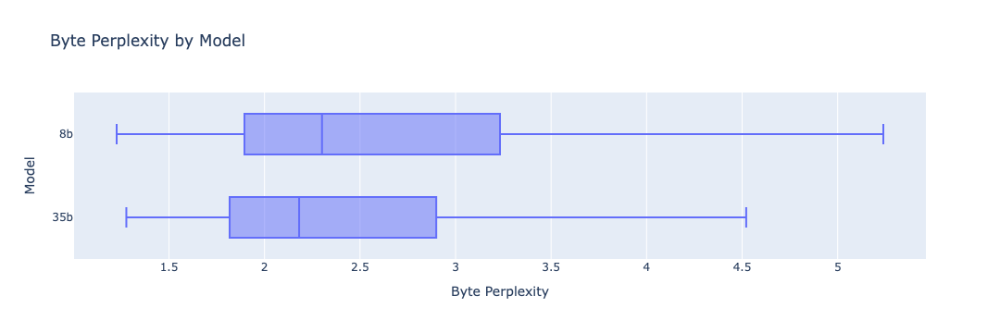

In [84]:
scaled_boxplot(df, group_vars=['model'], num_var='byte_perplexity',y_axis_var='model', layout_var={'title':'Byte Perplexity by Model',
            'xaxis_title':'Byte Perplexity',
            'yaxis_title':'Model',
            'boxmode':'group',
            'height': 400} )


# fig = px.box(df, x="byte_perplexity", y="model", title="Distribution of Byte Perplexity by Model")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title="Model")
# fig.show()

### Byte Perplexity by Chat Template

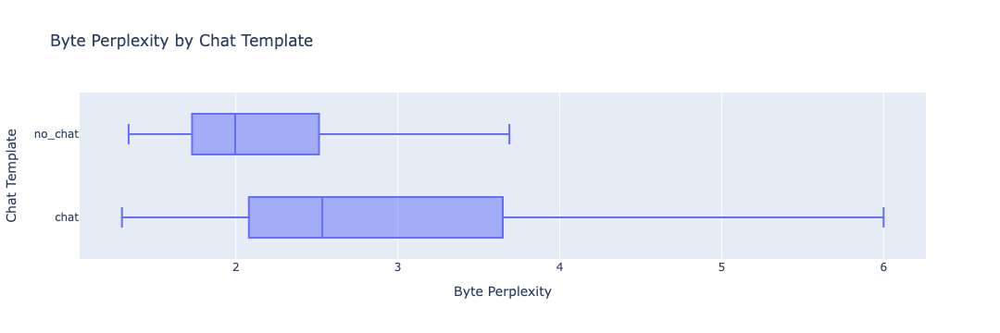

In [88]:
scaled_boxplot(df, group_vars=['template'], num_var='byte_perplexity',y_axis_var='template', layout_var={'title':'Byte Perplexity by Chat Template',
            'xaxis_title':'Byte Perplexity',
            'yaxis_title':'Chat Template',
            'boxmode':'group',
            'height': 400} )


# fig = px.box(df, x="byte_perplexity", y="template", title="Distribution of Byte Perplexity by Chat Template")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title=" Chat Template")
# fig.show()

### Byte Perplexity by Language

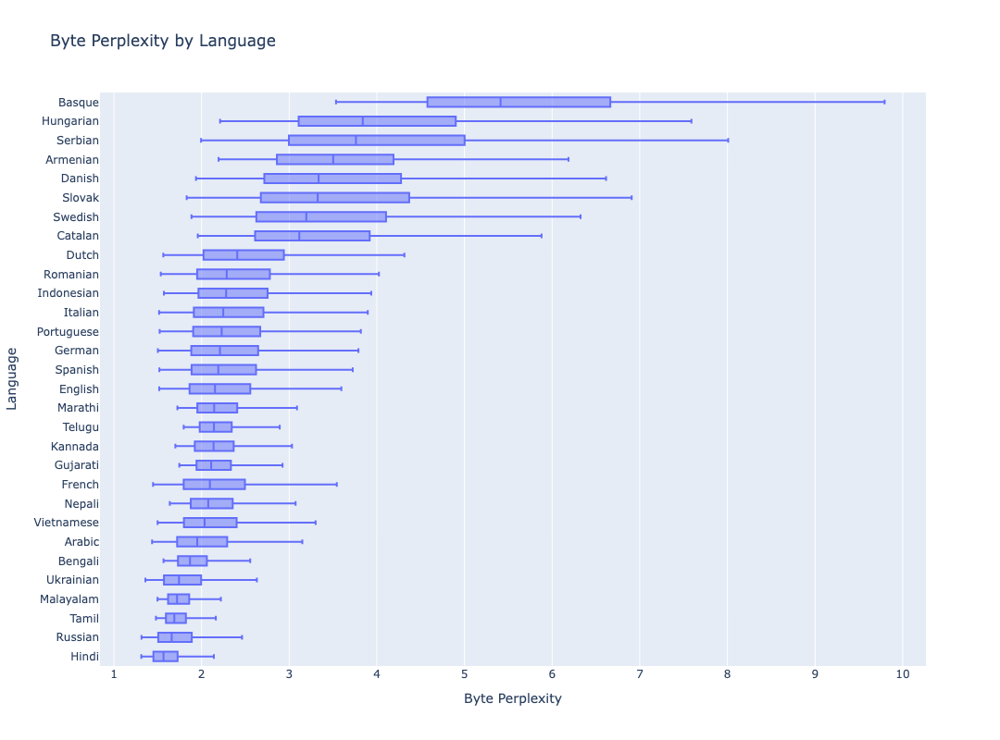

In [9]:
scaled_boxplot(df, group_vars=['lang'], num_var='byte_perplexity',y_axis_var='lang', layout_var={'title':'Byte Perplexity by Language',
            'xaxis_title':'Byte Perplexity',
            'yaxis_title':'Language',
            'boxmode':'group',
            'height': 800},
              order_by='50%')


# fig = px.box(df, x="byte_perplexity", y="template", title="Distribution of Byte Perplexity by Chat Template")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title=" Chat Template")
# fig.show()

### Byte Perplexity by Accuracy

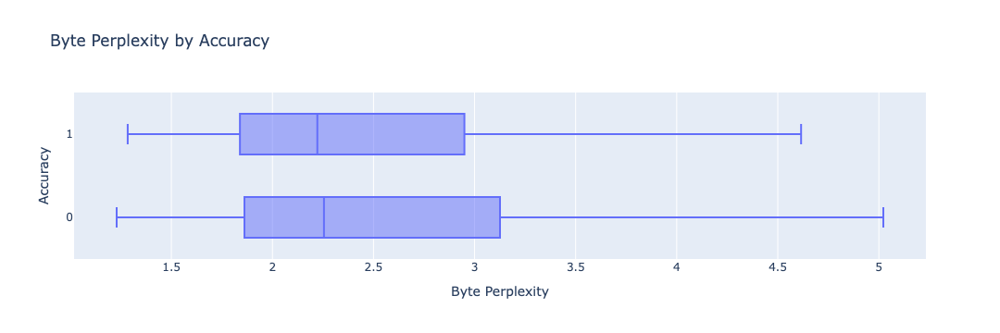

In [87]:
scaled_boxplot(df, group_vars=['acc'], num_var='byte_perplexity',y_axis_var='acc', layout_var={'title':'Byte Perplexity by Accuracy',
            'xaxis_title':'Byte Perplexity',
            'yaxis_title':'Accuracy',
            'boxmode':'group',
            'height': 400} )


# fig = px.box(df, x="byte_perplexity", y="template", title="Distribution of Byte Perplexity by Chat Template")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title=" Chat Template")
# fig.show()

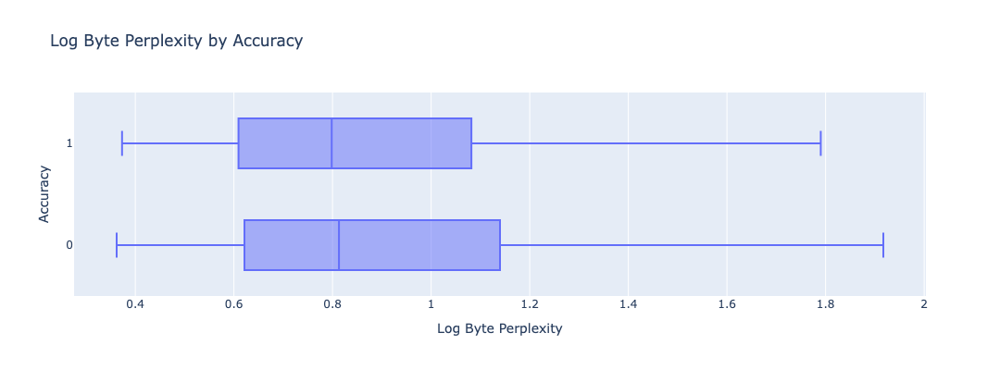

In [16]:
scaled_boxplot(df, group_vars=['acc'], num_var='log_byte_ppl',y_axis_var='acc', layout_var={'title':'Log Byte Perplexity by Accuracy',
            'xaxis_title':'Log Byte Perplexity',
            'yaxis_title':'Accuracy',
            'boxmode':'group',
            'height': 400} )


# fig = px.box(df, x="byte_perplexity", y="template", title="Distribution of Byte Perplexity by Chat Template")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title=" Chat Template")
# fig.show()

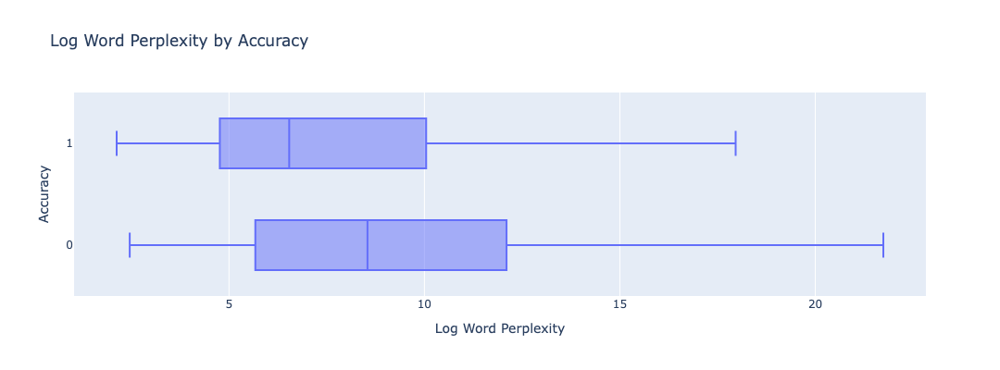

In [14]:
scaled_boxplot(df, group_vars=['acc'], num_var='log_word_ppl',y_axis_var='acc', layout_var={'title':'Log Word Perplexity by Accuracy',
            'xaxis_title':'Log Word Perplexity',
            'yaxis_title':'Accuracy',
            'boxmode':'group',
            'height': 400} )


# fig = px.box(df, x="byte_perplexity", y="template", title="Distribution of Byte Perplexity by Chat Template")
# fig.update_layout(xaxis_title="Byte Perplexity", yaxis_title=" Chat Template")
# fig.show()

### Byte Perplexity vs Language vs Acc

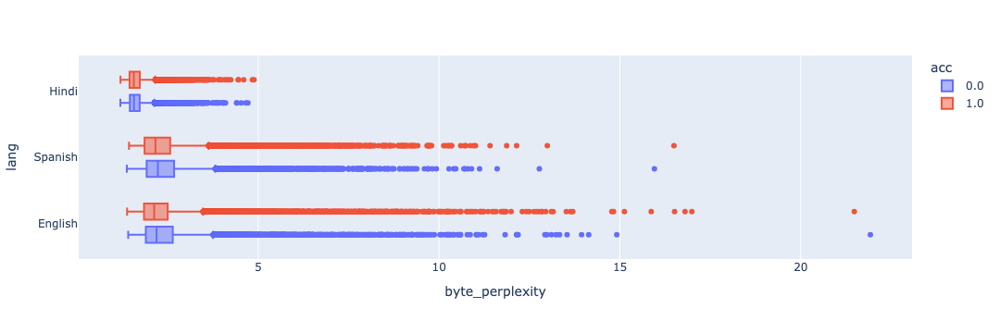

In [23]:
df_  = df[df.lang.isin(['English','Hindi','Spanish'])]
px.box(df_, y="lang", x="byte_perplexity", color="acc", orientation = 'h')

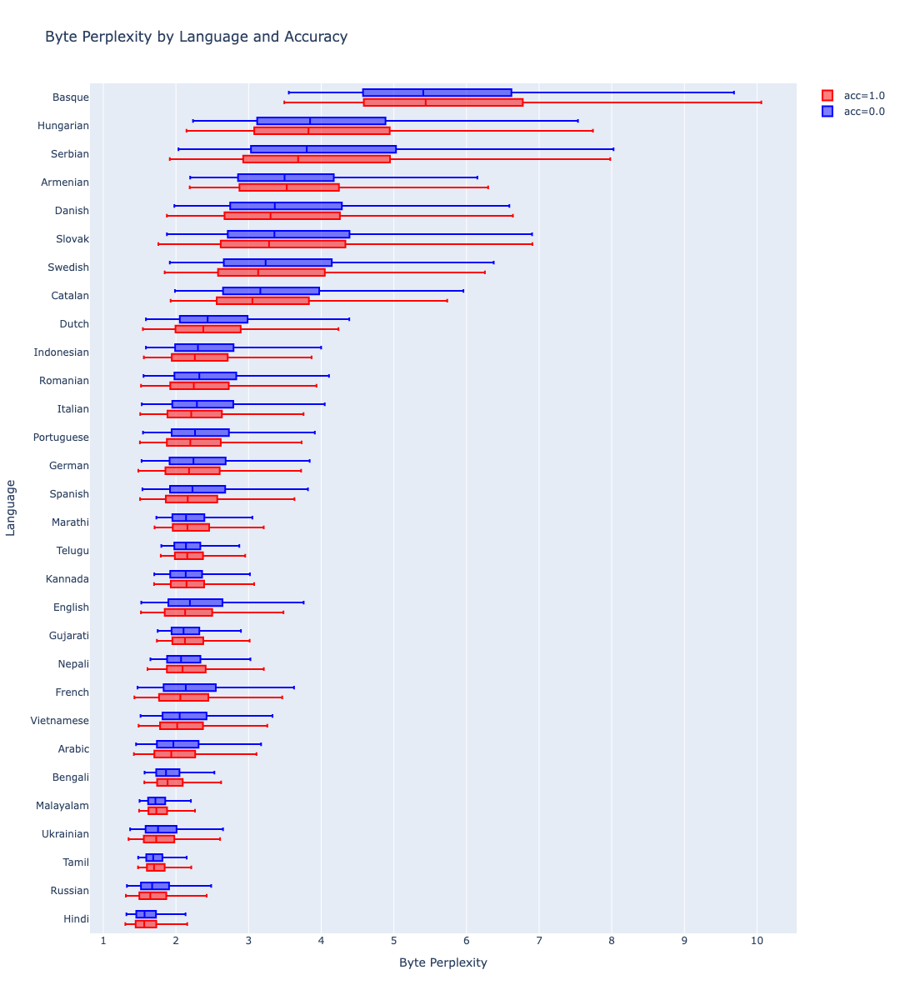

In [11]:
scaled_boxplot(df, group_vars=['lang','acc'], num_var = 'byte_perplexity', y_axis_var='lang',color_var='acc',
               layout_var={'title':'Byte Perplexity by Language and Accuracy',
            'xaxis_title':'Byte Perplexity',
            'yaxis_title':'Language',
            'boxmode':'group',
            'height': 1200},
               order_by = '50%'
)

In [17]:
# scaled_boxplot(df[df.trained == 'trained'], group_vars=['lang','acc'], num_var = 'byte_perplexity', y_axis_var='lang',color_var='acc',
#                layout_var={'title':'Byte Perplexity by Language and Accuracy',
#             'xaxis_title':'Byte Perplexity',
#             'yaxis_title':'Language',
#             'boxmode':'group',
#             'height': 1200},
#                order_by = '50%'
# )

In [8]:
grouped = df.groupby(['model', 'template'])['byte_perplexity'].agg(['min', 'q1', 'median', 'q3', 'max']).reset_index()

AttributeError: 'SeriesGroupBy' object has no attribute 'q1'

In [11]:
len(df)

1103820